# Load the data

In [1]:
import pandas
import numpy
import sys
%matplotlib inline
import matplotlib.pyplot as plt
from pandas.tools.plotting import scatter_matrix
import seaborn as sns
import numpy as np
import time
from sklearn import metrics
from sklearn import cross_validation
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, roc_curve, auc
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png', 'pdf')
# fix random seed for reproducibility
plt.rcParams['figure.figsize'] = (15, 6)

In [2]:
# fix random seed for reproducibility
seed = 7
numpy.random.seed(seed)
plt.rcParams['figure.figsize'] = (15, 6)
url1 = "http://archive.ics.uci.edu/ml/machine-learning-databases/poker/poker-hand-training-true.data"
names=['S1', 'C1', 'S2', 'C2', 'S3', 'C3','S4', 'C4', 'S5', 'C5', 'CLASS']
url2 = "http://archive.ics.uci.edu/ml/machine-learning-databases/poker/poker-hand-testing.data"
data = pandas.read_csv(url1, names=names)
test = pandas.read_csv(url2, names=names)

peek = data.head(10)
print(peek)
print '==============================================='
peektest = test.head(10)
print peektest

   S1  C1  S2  C2  S3  C3  S4  C4  S5  C5  CLASS
0   1  10   1  11   1  13   1  12   1   1      9
1   2  11   2  13   2  10   2  12   2   1      9
2   3  12   3  11   3  13   3  10   3   1      9
3   4  10   4  11   4   1   4  13   4  12      9
4   4   1   4  13   4  12   4  11   4  10      9
5   1   2   1   4   1   5   1   3   1   6      8
6   1   9   1  12   1  10   1  11   1  13      8
7   2   1   2   2   2   3   2   4   2   5      8
8   3   5   3   6   3   9   3   7   3   8      8
9   4   1   4   4   4   2   4   3   4   5      8
   S1  C1  S2  C2  S3  C3  S4  C4  S5  C5  CLASS
0   1   1   1  13   2   4   2   3   1  12      0
1   3  12   3   2   3  11   4   5   2   5      1
2   1   9   4   6   1   4   3   2   3   9      1
3   1   4   3  13   2  13   2   1   3   6      1
4   3  10   2   7   1   2   2  11   4   9      0
5   1   3   4   5   3   4   1  12   4   6      0
6   2   6   4  11   2   3   4   9   1   7      0
7   3   2   4   9   3   7   4   3   4   5      0
8   4   4   3  13   

In [3]:
shape = data.shape
print(shape)

(25010, 11)


In [4]:
types = data.dtypes
print(types)

S1       int64
C1       int64
S2       int64
C2       int64
S3       int64
C3       int64
S4       int64
C4       int64
S5       int64
C5       int64
CLASS    int64
dtype: object


In [5]:
pandas.set_option('display.width', 100)
pandas.set_option('precision', 3)
description = data.describe()
print(description)

              S1         C1         S2         C2         S3         C3         S4         C4  \
count  25010.000  25010.000  25010.000  25010.000  25010.000  25010.000  25010.000  25010.000   
mean       2.509      6.995      2.498      7.014      2.510      7.014      2.496      6.942   
std        1.116      3.750      1.122      3.767      1.123      3.745      1.116      3.747   
min        1.000      1.000      1.000      1.000      1.000      1.000      1.000      1.000   
25%        2.000      4.000      1.000      4.000      2.000      4.000      1.000      4.000   
50%        3.000      7.000      2.000      7.000      3.000      7.000      2.000      7.000   
75%        4.000     10.000      4.000     10.000      4.000     10.000      3.000     10.000   
max        4.000     13.000      4.000     13.000      4.000     13.000      4.000     13.000   

              S5         C5      CLASS  
count  25010.000  25010.000  25010.000  
mean       2.497      6.963      0.621  
std

In [6]:
class_counts = data.groupby('CLASS').size()
print 'Classes on training data'
print(class_counts)

Classes on training data
CLASS
0    12493
1    10599
2     1206
3      513
4       93
5       54
6       36
7        6
8        5
9        5
dtype: int64


In [7]:
class_counts = test.groupby('CLASS').size()
print 'Classes on testing data'
print(class_counts)

Classes on testing data
CLASS
0    501209
1    422498
2     47622
3     21121
4      3885
5      1996
6      1424
7       230
8        12
9         3
dtype: int64


In [8]:
correlations = data.corr(method='pearson')
print(correlations)

          S1         C1     S2         C2         S3     C3     S4     C4         S5     C5  CLASS
S1     1.000 -1.032e-02 -0.021  8.237e-03 -1.962e-02 -0.010 -0.017  0.004 -2.417e-02  0.007  0.008
C1    -0.010  1.000e+00  0.004 -1.099e-02 -3.824e-04 -0.026  0.004 -0.014  4.853e-03 -0.017  0.002
S2    -0.021  4.460e-03  1.000 -2.438e-03 -2.931e-02 -0.005 -0.021  0.012 -1.184e-02  0.006 -0.001
C2     0.008 -1.099e-02 -0.002  1.000e+00 -5.350e-03 -0.025 -0.008 -0.013  6.400e-04 -0.016 -0.005
S3    -0.020 -3.824e-04 -0.029 -5.350e-03  1.000e+00  0.018 -0.013  0.002 -3.031e-02 -0.002  0.004
C3    -0.010 -2.629e-02 -0.005 -2.470e-02  1.794e-02  1.000 -0.003 -0.016  3.731e-03 -0.011 -0.006
S4    -0.017  4.061e-03 -0.021 -8.390e-03 -1.300e-02 -0.003  1.000 -0.009 -1.820e-02  0.005 -0.002
C4     0.004 -1.444e-02  0.012 -1.293e-02  1.874e-03 -0.016 -0.009  1.000  2.810e-03 -0.015  0.010
S5    -0.024  4.853e-03 -0.012  6.400e-04 -3.031e-02  0.004 -0.018  0.003  1.000e+00 -0.003 -0.006
C5     0.0

In [9]:
skew = data.skew()
print(skew)

S1      -0.008
C1      -0.005
S2       0.005
C2      -0.005
S3      -0.010
C3      -0.003
S4       0.002
C4       0.013
S5      -0.001
C5       0.008
CLASS    2.275
dtype: float64


In [10]:
data.head()

,S1,C1,S2,C2,S3,C3,S4,C4,S5,C5,CLASS
0,1,10,1,11,1,13,1,12,1,1,9
1,2,11,2,13,2,10,2,12,2,1,9
2,3,12,3,11,3,13,3,10,3,1,9
3,4,10,4,11,4,1,4,13,4,12,9
4,4,1,4,13,4,12,4,11,4,10,9


In [11]:
data.tail()

,S1,C1,S2,C2,S3,C3,S4,C4,S5,C5,CLASS
25005,3,9,2,6,4,11,4,12,2,4,0
25006,4,1,4,10,3,13,3,4,1,10,1
25007,2,1,2,10,4,4,4,1,4,13,1
25008,2,12,4,3,1,10,1,12,4,9,1
25009,1,7,3,11,3,3,4,8,3,7,1


In [12]:
correlations = data.corr(method='pearson')
print(correlations)

          S1         C1     S2         C2         S3     C3     S4     C4         S5     C5  CLASS
S1     1.000 -1.032e-02 -0.021  8.237e-03 -1.962e-02 -0.010 -0.017  0.004 -2.417e-02  0.007  0.008
C1    -0.010  1.000e+00  0.004 -1.099e-02 -3.824e-04 -0.026  0.004 -0.014  4.853e-03 -0.017  0.002
S2    -0.021  4.460e-03  1.000 -2.438e-03 -2.931e-02 -0.005 -0.021  0.012 -1.184e-02  0.006 -0.001
C2     0.008 -1.099e-02 -0.002  1.000e+00 -5.350e-03 -0.025 -0.008 -0.013  6.400e-04 -0.016 -0.005
S3    -0.020 -3.824e-04 -0.029 -5.350e-03  1.000e+00  0.018 -0.013  0.002 -3.031e-02 -0.002  0.004
C3    -0.010 -2.629e-02 -0.005 -2.470e-02  1.794e-02  1.000 -0.003 -0.016  3.731e-03 -0.011 -0.006
S4    -0.017  4.061e-03 -0.021 -8.390e-03 -1.300e-02 -0.003  1.000 -0.009 -1.820e-02  0.005 -0.002
C4     0.004 -1.444e-02  0.012 -1.293e-02  1.874e-03 -0.016 -0.009  1.000  2.810e-03 -0.015  0.010
S5    -0.024  4.853e-03 -0.012  6.400e-04 -3.031e-02  0.004 -0.018  0.003  1.000e+00 -0.003 -0.006
C5     0.0

# Visulize the data

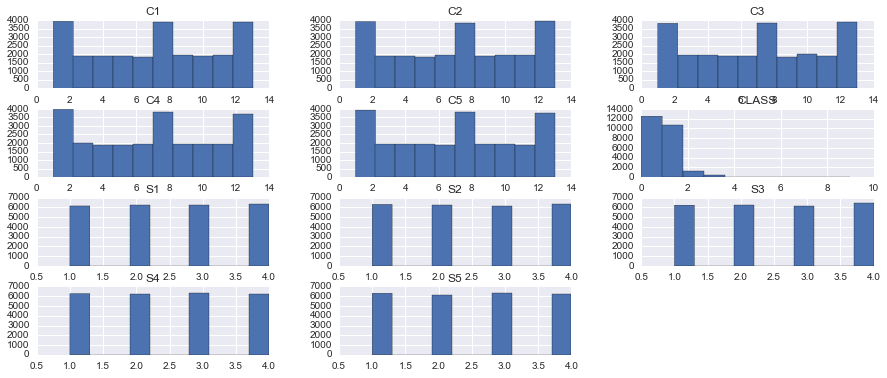

In [13]:
data.hist()
plt.show()

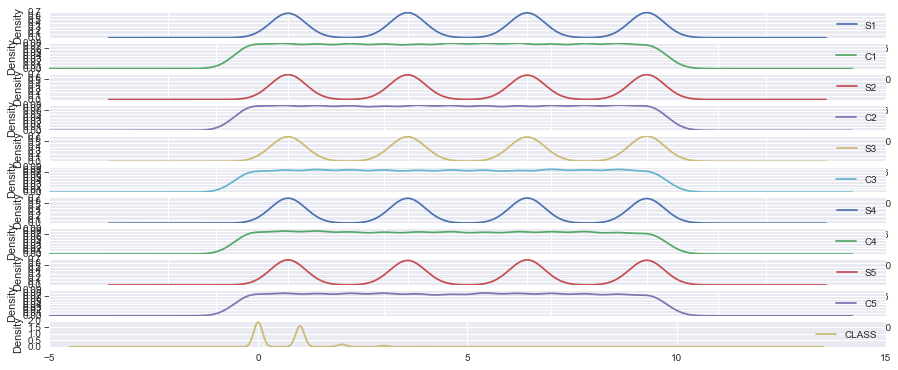

In [14]:
data.plot(kind='density', subplots=True,  sharex=False)
plt.show()

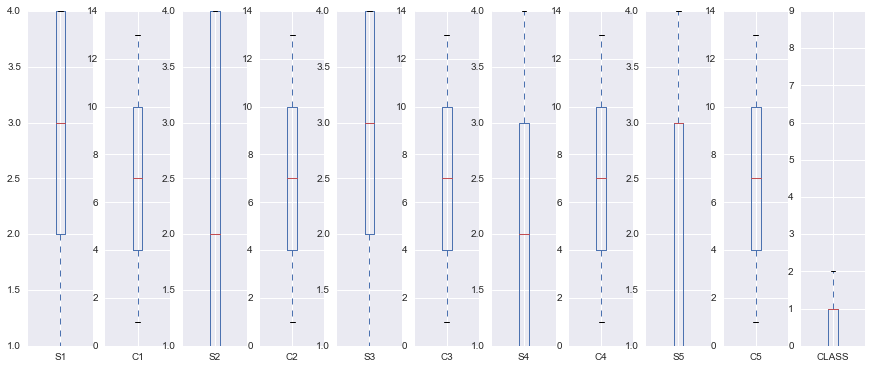

In [15]:
data.plot(kind='box', subplots=True,  sharex=False, sharey=False)
plt.show()

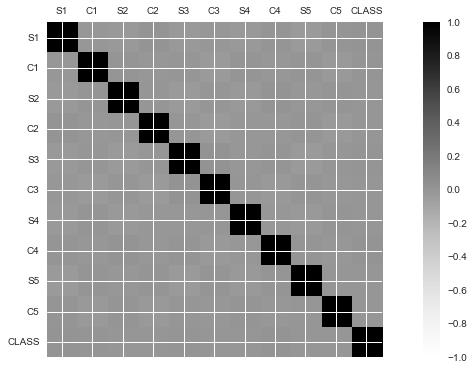

In [16]:
correlations = data.corr()
# plot correlation matrix
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(correlations, vmin=-1, vmax=1)
fig.colorbar(cax)
ticks = numpy.arange(0,11,1)
ax.set_xticks(ticks)
ax.set_yticks(ticks)
ax.set_xticklabels(names)
ax.set_yticklabels(names)
plt.show()

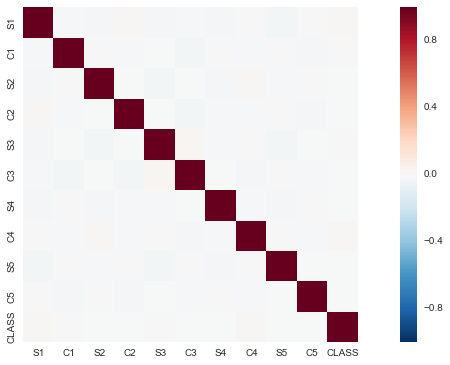

In [17]:
# Encode the categorical features as numbers
def number_encode_features(df):
    result = df.copy()
    encoders = {}
    for column in result.columns:
        if result.dtypes[column] == np.object:
            encoders[column] = preprocessing.LabelEncoder()
            result[column] = encoders[column].fit_transform(result[column])
    return result, encoders

# Calculate the correlation and plot it
encoded_data, _ = number_encode_features(data)
sns.heatmap(encoded_data.corr(), square=True)
plt.show()

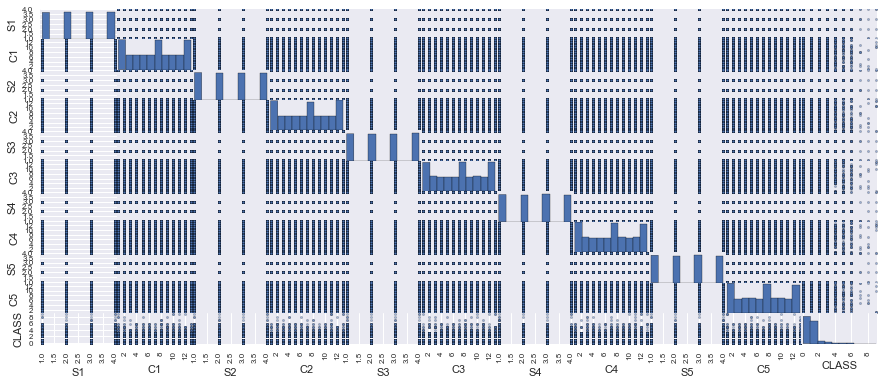

In [18]:
scatter_matrix(data)
plt.show()

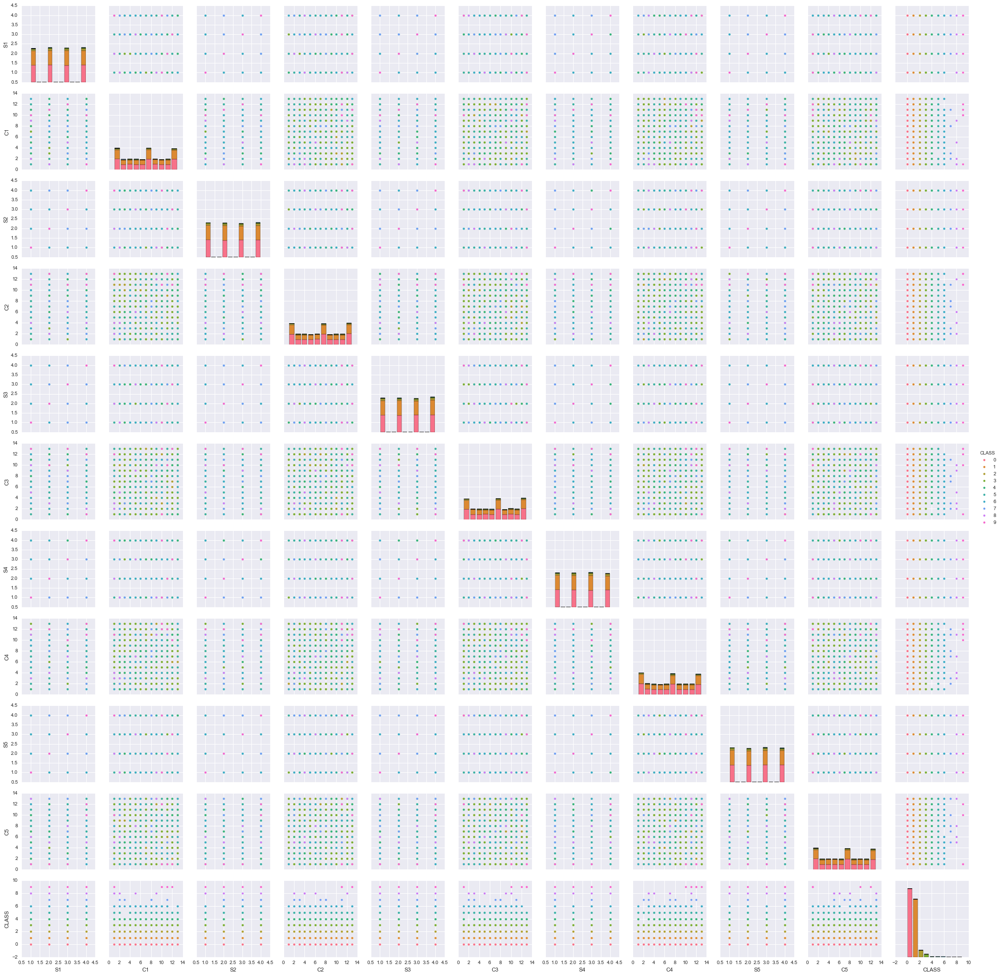

In [19]:
import seaborn as sns
sns.pairplot(data, hue='CLASS')

# Prepare the data for classification

In [20]:
from sklearn import preprocessing
# for training data
dataset = data.values
X = dataset[:,0:10].astype(float)
Y = dataset[:,10]
features = preprocessing.scale(X)
target = Y

In [21]:
# for testing data
datasetTest = test.values
X = datasetTest[:,0:10].astype(float)
Y = datasetTest[:,10]
X_deploy = preprocessing.scale(X)
y_deploy = Y

In [22]:
from sklearn.cross_validation import train_test_split
# Extracting 20% validation data
X_train, X_test, y_train, y_test = train_test_split(
    features, target, test_size=0.20, random_state=17)

print 'Number of training examples',len(X_train)
print 'Number of validation examples',len(X_test)
print 'Number of testing examples',len(X_deploy)


Number of training examples 20008
Number of validation examples 5002
Number of testing examples 1000000


In [23]:
from sklearn.cross_validation import StratifiedShuffleSplit

## Preproccing

In [24]:
from sklearn import preprocessing
# normalize the data attributes
X_train = preprocessing.normalize(X_train)
X_test = preprocessing.normalize(X_test)
X_deploy = preprocessing.normalize(X_deploy)
# standardize the data attributes
X_train = preprocessing.scale(X_train)
X_test = preprocessing.scale(X_test)
X_deploy = preprocessing.scale(X_deploy)

# Feature Selection

In [25]:
from sklearn import metrics
from sklearn.ensemble import ExtraTreesClassifier
model = ExtraTreesClassifier()
model.fit(X_train, y_train)
# display the relative importance of each attribute
print(model.feature_importances_)

[ 0.09364276  0.10591304  0.09640281  0.10532782  0.09378797  0.10451696
  0.0945217   0.10605592  0.09575366  0.10407736]


# Building classifiers

## KNN classifier
It turns out that k=5 is the best choose of k on the validation set

In [26]:
from sklearn.neighbors import KNeighborsClassifier
clf_neigh = KNeighborsClassifier(n_neighbors=5)
#Training
start_time = time.time()
clf_neigh.fit(X_train, y_train)
print("The time for training KNN is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_neigh.predict(X_test)
print "\n==================================================================="
print "The accuracy on validation dataset of Knn : \t", metrics.accuracy_score(y_test, y_pred)
print "==================================================================="
print metrics.classification_report(y_test, y_pred, target_names=['0' , '1' , '2' , '3' , '4' , '5' , '6' , '7' , '8' , '9'])

The time for training KNN is  0.0181131362915 seconds 

The accuracy on validation dataset of Knn : 	0.509596161535
             precision    recall  f1-score   support

          0       0.53      0.66      0.59      2440
          1       0.48      0.43      0.45      2166
          2       0.09      0.01      0.02       225
          3       0.00      0.00      0.00       126
          4       0.00      0.00      0.00        20
          5       0.33      0.06      0.11        16
          6       0.00      0.00      0.00         4
          7       0.00      0.00      0.00         2
          8       0.00      0.00      0.00         2
          9       0.00      0.00      0.00         1

avg / total       0.47      0.51      0.49      5002



/Users/salemameen/Library/Enthought/Canopy_64bit/User/lib/python2.7/site-packages/sklearn/metrics/classification.py:1074: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


## SVM classifier
### Linear SVM "LinearSVC"
It turns out that C=20 is the best on the validation set

In [27]:
from sklearn.svm import LinearSVC
clf_svm_linear = LinearSVC(C=20.0)
#Training
start_time = time.time()
clf_svm_linear.fit(X_train, y_train)
print("The time for training SVM is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_svm_linear.predict(X_test)
print "\n==================================================================="
print "The accuracy on validation dataset of Linear SVC: \t", metrics.accuracy_score(y_test, y_pred)
print "==================================================================="
print metrics.classification_report(y_test, y_pred, target_names=['0' , '1' , '2' , '3' , '4' , '5' , '6' , '7' , '8' , '9'])

The time for training SVM is  11.280424118 seconds 

The accuracy on validation dataset of Linear SVC: 	0.47580967613
             precision    recall  f1-score   support

          0       0.49      0.81      0.61      2440
          1       0.43      0.18      0.26      2166
          2       0.00      0.00      0.00       225
          3       0.00      0.00      0.00       126
          4       0.00      0.00      0.00        20
          5       0.00      0.00      0.00        16
          6       0.00      0.00      0.00         4
          7       0.00      0.00      0.00         2
          8       0.00      0.00      0.00         2
          9       0.00      0.00      0.00         1

avg / total       0.42      0.48      0.41      5002



###  SVM "SVC" with kernel='rbf' 
It turns out that C=5 is the best on the validation set


In [28]:
from sklearn.svm import SVC
clf_svm = SVC(C=5.0, kernel='rbf')
#Training
start_time = time.time()
clf_svm.fit(X_train, y_train)
print("The time for training SVM is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_svm.predict(X_test)
print "\n==================================================================="
print "The accuracy on validation dataset of SVC: \t", metrics.accuracy_score(y_test, y_pred)
print "==================================================================="
print metrics.classification_report(y_test, y_pred, target_names=['0' , '1' , '2' , '3' , '4' , '5' , '6' , '7' , '8' , '9'])

The time for training SVM is  24.9475369453 seconds 

The accuracy on validation dataset of SVC: 	0.549180327869
             precision    recall  f1-score   support

          0       0.56      0.76      0.65      2440
          1       0.53      0.41      0.46      2166
          2       0.00      0.00      0.00       225
          3       0.00      0.00      0.00       126
          4       0.00      0.00      0.00        20
          5       0.00      0.00      0.00        16
          6       0.00      0.00      0.00         4
          7       0.00      0.00      0.00         2
          8       0.00      0.00      0.00         2
          9       0.00      0.00      0.00         1

avg / total       0.50      0.55      0.52      5002



## Decsion Tree classifier
### DT with Gini impurity "gini", CART (Classification and Regression Trees)
It turns out that min_samples_split=2 is the best on the validation set

In [29]:
# CART tree
from sklearn.tree import DecisionTreeClassifier
clf_dt = DecisionTreeClassifier(min_samples_split=2)
#Training
start_time = time.time()
clf_dt.fit(X_train, y_train)
print("The time for training Decision Tree is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_dt.predict(X_test)
print "\n==================================================================="
print "The accuracy on validation dataset of DT : \t", metrics.accuracy_score(y_test, y_pred)
print "==================================================================="
print metrics.classification_report(y_test, y_pred, target_names=['0' , '1' , '2' , '3' , '4' , '5' , '6' , '7' , '8' , '9'])


The time for training Decision Tree is  0.496137857437 seconds 

The accuracy on validation dataset of DT : 	0.480607756897
             precision    recall  f1-score   support

          0       0.56      0.56      0.56      2440
          1       0.47      0.47      0.47      2166
          2       0.06      0.06      0.06       225
          3       0.09      0.08      0.09       126
          4       0.00      0.00      0.00        20
          5       0.00      0.00      0.00        16
          6       0.00      0.00      0.00         4
          7       0.00      0.00      0.00         2
          8       0.00      0.00      0.00         2
          9       0.00      0.00      0.00         1

avg / total       0.48      0.48      0.48      5002



### DT with “entropy” for the information gain, C4.5 (aka J48 is an open source Java Weka) and C5.0
It turns out that min_samples_split=2 is the best on the validation set

In [30]:
# Here I use C5.0 tree as its more accurate that C4.5 and more recent.
from sklearn.tree import DecisionTreeClassifier
clf_dt_IG = DecisionTreeClassifier(criterion='entropy', min_samples_split=2)
#Training
start_time = time.time()
clf_dt_IG.fit(X_train, y_train)
print("The time for training Decision Tree is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_dt_IG.predict(X_test)
print "\n==================================================================="
print "The accuracy on validation dataset of DT : \t", metrics.accuracy_score(y_test, y_pred)
print "==================================================================="
print metrics.classification_report(y_test, y_pred, target_names=['0' , '1' , '2' , '3' , '4' , '5' , '6' , '7' , '8' , '9'])


The time for training Decision Tree is  1.05872797966 seconds 

The accuracy on validation dataset of DT : 	0.486605357857
             precision    recall  f1-score   support

          0       0.57      0.58      0.57      2440
          1       0.47      0.46      0.47      2166
          2       0.09      0.11      0.10       225
          3       0.07      0.06      0.07       126
          4       0.07      0.10      0.08        20
          5       0.00      0.00      0.00        16
          6       0.00      0.00      0.00         4
          7       0.00      0.00      0.00         2
          8       0.00      0.00      0.00         2
          9       0.00      0.00      0.00         1

avg / total       0.49      0.49      0.49      5002



 Ensemble methods

## Bagging Method


### Bagging Method with Knn


Using Best KNN classifier fitted the data, each built on random subsets of 50% of the samples and 50% of the features.

In [31]:
from sklearn.ensemble import BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier
clf_dt_BGKN = BaggingClassifier(KNeighborsClassifier(n_neighbors=5),
                             max_samples=0.5, max_features=0.5)
start_time = time.time()
clf_dt_BGKN.fit(X_train, y_train)
print("The time for training Bagging Knn is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_dt_BGKN.predict(X_test)
print "\n==================================================================="
print "The accuracy on validation dataset of Bagging_knn: \t", metrics.accuracy_score(y_test, y_pred)
print "==================================================================="
print metrics.classification_report(y_test, y_pred, target_names=['0' , '1' , '2' , '3' , '4' , '5' , '6' , '7' , '8' , '9'])


The time for training Bagging Knn is  0.0809309482574 seconds 

The accuracy on validation dataset of Bagging_knn: 	0.522990803679
             precision    recall  f1-score   support

          0       0.54      0.76      0.63      2440
          1       0.50      0.35      0.41      2166
          2       0.00      0.00      0.00       225
          3       0.00      0.00      0.00       126
          4       0.00      0.00      0.00        20
          5       0.00      0.00      0.00        16
          6       0.00      0.00      0.00         4
          7       0.00      0.00      0.00         2
          8       0.00      0.00      0.00         2
          9       0.00      0.00      0.00         1

avg / total       0.48      0.52      0.48      5002



### Bagging Method with DT


Using Best DT with 'entropy', each built on random subsets of 50% of the samples and 50% of the features.

In [32]:
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
clf_dt_BGDT = BaggingClassifier(DecisionTreeClassifier(criterion='entropy', min_samples_split=2),
                             max_samples=0.5, max_features=0.5)
start_time = time.time()
clf_dt_BGDT.fit(X_train, y_train)
print("The time for training Bagging DT is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_dt_BGDT.predict(X_test)
print "\n==================================================================="
print "The accuracy on validation dataset of Bagging_DT: \t", metrics.accuracy_score(y_test, y_pred)
print "==================================================================="
print metrics.classification_report(y_test, y_pred, target_names=['0' , '1' , '2' , '3' , '4' , '5' , '6' , '7' , '8' , '9'])


The time for training Bagging DT is  1.54153990746 seconds 

The accuracy on validation dataset of Bagging_DT: 	0.535585765694
             precision    recall  f1-score   support

          0       0.55      0.74      0.63      2440
          1       0.51      0.40      0.45      2166
          2       0.10      0.00      0.01       225
          3       0.50      0.02      0.03       126
          4       0.00      0.00      0.00        20
          5       0.00      0.00      0.00        16
          6       0.00      0.00      0.00         4
          7       0.00      0.00      0.00         2
          8       0.00      0.00      0.00         2
          9       0.00      0.00      0.00         1

avg / total       0.51      0.54      0.50      5002



## Random Forest
DT with 'gini'

In [33]:
from sklearn.ensemble import RandomForestClassifier
clf_dt_RF = RandomForestClassifier()
#Training
start_time = time.time()
clf_dt_RF.fit(X_train, y_train)
print("The time for training Decision Tree is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_dt_RF.predict(X_test)
print "\n==================================================================="
print "The accuracy on validation dataset of RF : \t", metrics.accuracy_score(y_test, y_pred)
print "==================================================================="
print metrics.classification_report(y_test, y_pred, target_names=['0' , '1' , '2' , '3' , '4' , '5' , '6' , '7' , '8' , '9'])


The time for training Decision Tree is  1.02347707748 seconds 

The accuracy on validation dataset of RF : 	0.542782886845
             precision    recall  f1-score   support

          0       0.56      0.72      0.63      2440
          1       0.51      0.43      0.47      2166
          2       0.13      0.02      0.03       225
          3       0.75      0.02      0.05       126
          4       0.00      0.00      0.00        20
          5       0.00      0.00      0.00        16
          6       0.00      0.00      0.00         4
          7       0.00      0.00      0.00         2
          8       0.00      0.00      0.00         2
          9       0.00      0.00      0.00         1

avg / total       0.52      0.54      0.52      5002



### Ada Boost
DT with 'gini'

In [34]:
from sklearn.ensemble import AdaBoostClassifier
clf_dt_AD = AdaBoostClassifier()
#Training
start_time = time.time()
clf_dt_AD.fit(X_train, y_train)
print("The time for training Decision Tree is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_dt_AD.predict(X_test)
print "\n==================================================================="
print "The accuracy on validation dataset of Ada boost : \t", metrics.accuracy_score(y_test, y_pred)
print "==================================================================="
print metrics.classification_report(y_test, y_pred, target_names=['0' , '1' , '2' , '3' , '4' , '5' , '6' , '7' , '8' , '9'])


The time for training Decision Tree is  1.68650102615 seconds 

The accuracy on validation dataset of Ada boost : 	0.492003198721
             precision    recall  f1-score   support

          0       0.49      0.96      0.65      2440
          1       0.49      0.05      0.09      2166
          2       0.00      0.00      0.00       225
          3       0.00      0.00      0.00       126
          4       0.00      0.00      0.00        20
          5       0.00      0.00      0.00        16
          6       0.00      0.00      0.00         4
          7       0.00      0.00      0.00         2
          8       0.00      0.00      0.00         2
          9       0.00      0.00      0.00         1

avg / total       0.45      0.49      0.36      5002



## Naive Bayes methods

In [35]:
from sklearn.naive_bayes import GaussianNB
clf_NB = GaussianNB()
#Training
start_time = time.time()
clf_NB.fit(X_train, y_train)
print("The time for training Naive Bayes is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_NB.predict(X_test)
print "\n==================================================================="
print "The accuracy on validation dataset of NB: \t", metrics.accuracy_score(y_test, y_pred)
print "==================================================================="
print metrics.classification_report(y_test, y_pred, target_names=['0' , '1' , '2' , '3' , '4' , '5' , '6' , '7' , '8' , '9'])


The time for training Naive Bayes is  0.00606298446655 seconds 

The accuracy on validation dataset of NB: 	0.487604958017
             precision    recall  f1-score   support

          0       0.49      1.00      0.66      2440
          1       0.00      0.00      0.00      2166
          2       0.00      0.00      0.00       225
          3       0.00      0.00      0.00       126
          4       0.00      0.00      0.00        20
          5       0.00      0.00      0.00        16
          6       0.00      0.00      0.00         4
          7       0.00      0.00      0.00         2
          8       0.00      0.00      0.00         2
          9       0.00      0.00      0.00         1

avg / total       0.24      0.49      0.32      5002



## Linear Discriminant Analysis classifier

In [36]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
clf_dt_LDA = LinearDiscriminantAnalysis()
#Training
start_time = time.time()
clf_dt_LDA.fit(X_train, y_train)
print("The time for training Decision Tree is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_dt_LDA.predict(X_test)
print "\n==================================================================="
print "The accuracy on validation dataset of LDA: \t", metrics.accuracy_score(y_test, y_pred)
print "==================================================================="
print metrics.classification_report(y_test, y_pred, target_names=['0' , '1' , '2' , '3' , '4' , '5' , '6' , '7' , '8' , '9'])


The time for training Decision Tree is  0.0186810493469 seconds 

The accuracy on validation dataset of LDA: 	0.487804878049
             precision    recall  f1-score   support

          0       0.49      1.00      0.66      2440
          1       0.00      0.00      0.00      2166
          2       0.00      0.00      0.00       225
          3       0.00      0.00      0.00       126
          4       0.00      0.00      0.00        20
          5       0.00      0.00      0.00        16
          6       0.00      0.00      0.00         4
          7       0.00      0.00      0.00         2
          8       0.00      0.00      0.00         2
          9       0.00      0.00      0.00         1

avg / total       0.24      0.49      0.32      5002



## Quadratic Discriminant Analysis classifier

In [37]:
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
clf_dt_QDA = QuadraticDiscriminantAnalysis()
#Training
start_time = time.time()
clf_dt_QDA.fit(X_train, y_train)
print("The time for training Decision Tree is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_dt_QDA.predict(X_test)
print "\n==================================================================="
print "The accuracy on validation dataset of QDA : \t", metrics.accuracy_score(y_test, y_pred)
print "==================================================================="
print metrics.classification_report(y_test, y_pred, target_names=['0' , '1' , '2' , '3' , '4' , '5' , '6' , '7' , '8' , '9'])

The time for training Decision Tree is  0.0115690231323 seconds 

The accuracy on validation dataset of QDA : 	0.542982806877
             precision    recall  f1-score   support

          0       0.55      0.83      0.66      2440
          1       0.53      0.32      0.40      2166
          2       0.00      0.00      0.00       225
          3       0.00      0.00      0.00       126
          4       0.00      0.00      0.00        20
          5       0.00      0.00      0.00        16
          6       0.00      0.00      0.00         4
          7       0.00      0.00      0.00         2
          8       0.00      0.00      0.00         2
          9       0.00      0.00      0.00         1

avg / total       0.50      0.54      0.49      5002



/Users/salemameen/Library/Enthought/Canopy_64bit/User/lib/python2.7/site-packages/sklearn/discriminant_analysis.py:688: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


## Neural Networks  classifier

In [38]:
import seaborn as sns
import numpy as np
from sklearn.cross_validation import train_test_split
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.regularizers import l2

from keras.utils import np_utils

labelsTrain = np_utils.to_categorical(y_train)
labelsTest = np_utils.to_categorical(y_test)                                              
model = Sequential()
model.add(Dense(25,
                input_shape=(10,), 
                activation="relu",
                W_regularizer=l2(0.001)))
#model.add(Dropout(0.5))
model.add(Dense(10, activation="softmax"))

model.compile(loss='categorical_crossentropy',
              metrics=['accuracy'],
              optimizer='adam')
# Actual modelling
start_time = time.time()
model.fit(X_train, labelsTrain, verbose=0, batch_size=100, nb_epoch=100)
print("The time for training NN is  %s seconds " % (time.time() - start_time))
score, accuracy = model.evaluate(X_test, labelsTest, batch_size=100, verbose=0)
print("Test fraction correct (NN-Score) = {:.2f}".format(score))
print("Test fraction correct (NN-Accuracy) = {:.2f}".format(accuracy))

Using TensorFlow backend.


Epoch 1/100
20008/20008 [==============================] - 2s - loss: 1.7429 - acc: 0.3523     
Epoch 2/100
20008/20008 [==============================] - 2s - loss: 1.0862 - acc: 0.4930     
Epoch 3/100
20008/20008 [==============================] - 2s - loss: 1.0214 - acc: 0.5049     
Epoch 4/100
20008/20008 [==============================] - 2s - loss: 1.0016 - acc: 0.5195     
Epoch 5/100
20008/20008 [==============================] - 2s - loss: 0.9903 - acc: 0.5333     
Epoch 6/100
20008/20008 [==============================] - 2s - loss: 0.9832 - acc: 0.5353     
Epoch 7/100
20008/20008 [==============================] - 2s - loss: 0.9773 - acc: 0.5382     
Epoch 8/100
20008/20008 [==============================] - 2s - loss: 0.9725 - acc: 0.5449     
Epoch 9/100
20008/20008 [==============================] - 2s - loss: 0.9691 - acc: 0.5444     
Epoch 10/100
20008/20008 [==============================] - 2s - loss: 0.9660 - acc: 0.5472     
Epoch 11/100
20008/20008 [=============

In [39]:
y_pred = model.predict_classes(X_test)
print "==================================================================="
print "The accuracy on validation dataset of Neural Network: \t", metrics.accuracy_score(y_test, y_pred)
print "==================================================================="
print metrics.classification_report(y_test, y_pred, target_names=['0' , '1' , '2' , '3' , '4' , '5' , '6' , '7' , '8' , '9'])


5002/5002 [==============================] - 0s     
The accuracy on validation dataset of Neural Network: 	0.568772491004
             precision    recall  f1-score   support

          0       0.59      0.75      0.66      2440
          1       0.54      0.47      0.50      2166
          2       0.00      0.00      0.00       225
          3       0.00      0.00      0.00       126
          4       0.00      0.00      0.00        20
          5       0.00      0.00      0.00        16
          6       0.00      0.00      0.00         4
          7       0.00      0.00      0.00         2
          8       0.00      0.00      0.00         2
          9       0.00      0.00      0.00         1

avg / total       0.52      0.57      0.54      5002



In [40]:
path = './poker/'
sys.path.append("./poker")
model.save_weights('pokerModelbest.hdf5',overwrite=True)

In [41]:
np.save('./poker/X_train', X_train)
np.save('./poker/y_train', y_train)
np.save('./poker/X_test', X_test)
np.save('./poker/y_test', y_test)
np.save('./poker/X_deploy', X_deploy)
np.save('./poker/y_deploy', y_deploy)